In [202]:
#The usual modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from tqdm import *

#For feature selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif

#For data splitting
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, cross_val_score
from sklearn import preprocessing

# Get ML  classifiers
from sklearn.linear_model import Perceptron
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier 
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

#Get model metrics for model evaluation
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import classification_report, roc_curve, auc,make_scorer, classification_report,roc_auc_score
from sklearn.model_selection import cross_val_predict

#For parameter grid search optimization
from sklearn.model_selection import GridSearchCV

#For confusion matrix display
import scikitplot as skplt

#For simplified understanding of the importance model features
import eli5
from eli5.sklearn import PermutationImportance

#For generating partial dependence plots
from pdpbox import pdp, info_plots

#For calculation of shap values to further assess contributions of model features 
import shap

## Problem Statement
* Goal is to classify emails as either spam or real email. This is a binary classification problem.

The spambase includes 57 features (columns) and 4601 e-mails (rows). Its features are characterized as follows:

* word_freq_address - percentage of words in the e-mail that match ADDRESS.
* charfreq# - percentage of characters in the e-mail that match the symbol '#'.
* capital_run_length_average - average lenth of uninterrupted sequences of capital letters.
* capital_run_length_longest - length of longest uninterrupted sequence of catipal letters.
* capital_run_length_total - total number of capital letters in the email.

Spam class is set as either 0 (non-spam) or 1 (spam).

The features are all numerical and continuous. The target variable is categorical and nominal.

Given this, ANOVA is likely the best suited feature selection method to carry out dimensionality reduction.

How to classify accuracy?
* False positive --> Real email is classified as spam (not good!)  
* False negative --> Spam is not classified as spam (not good but not as bad)
* Sensitivity vs Specificity

Low Sensitivity --> Model will classify spam as not spam

High sensitivity --> Model is good at predicting spam

High specificity -> Model is good at identifying non-spam

Low Specificity -> Model will classify non-spam as spam

* Therefore, need to optimize model for high specificity since low specificity would result in loss of real emails. 

In [41]:
#Load the column names from spambase.names file
def get_colnames():
    with open('spambase.names',"r") as f:
        lines = []
        for line in f:
            if line.startswith("1, 0."):
                for line in f:
                    if len(line.strip()) > 0:
                        lines.append(line.replace('continuous.',"").replace(':',"").replace('\n',"").strip())
                
    return lines
cols = get_colnames()
cols.append('spam')
print(cols, end = "")

['word_freq_make', 'word_freq_address', 'word_freq_all', 'word_freq_3d', 'word_freq_our', 'word_freq_over', 'word_freq_remove', 'word_freq_internet', 'word_freq_order', 'word_freq_mail', 'word_freq_receive', 'word_freq_will', 'word_freq_people', 'word_freq_report', 'word_freq_addresses', 'word_freq_free', 'word_freq_business', 'word_freq_email', 'word_freq_you', 'word_freq_credit', 'word_freq_your', 'word_freq_font', 'word_freq_000', 'word_freq_money', 'word_freq_hp', 'word_freq_hpl', 'word_freq_george', 'word_freq_650', 'word_freq_lab', 'word_freq_labs', 'word_freq_telnet', 'word_freq_857', 'word_freq_data', 'word_freq_415', 'word_freq_85', 'word_freq_technology', 'word_freq_1999', 'word_freq_parts', 'word_freq_pm', 'word_freq_direct', 'word_freq_cs', 'word_freq_meeting', 'word_freq_original', 'word_freq_project', 'word_freq_re', 'word_freq_edu', 'word_freq_table', 'word_freq_conference', 'char_freq_;', 'char_freq_(', 'char_freq_[', 'char_freq_!', 'char_freq_$', 'char_freq_#', 'capita

In [96]:
#Place results into dataframe
df = pd.read_csv('spambase.data',names = cols)
df.head()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,...,char_freq_;,char_freq_(,char_freq_[,char_freq_!,char_freq_$,char_freq_#,capital_run_length_average,capital_run_length_longest,capital_run_length_total,spam
0,0.00,0.64,0.64,0.0,0.32,0.00,0.00,0.00,0.00,0.00,...,0.00,0.000,0.0,0.778,0.000,0.000,3.756,61,278,1
1,0.21,0.28,0.50,0.0,0.14,0.28,0.21,0.07,0.00,0.94,...,0.00,0.132,0.0,0.372,0.180,0.048,5.114,101,1028,1
2,0.06,0.00,0.71,0.0,1.23,0.19,0.19,0.12,0.64,0.25,...,0.01,0.143,0.0,0.276,0.184,0.010,9.821,485,2259,1
3,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,...,0.00,0.137,0.0,0.137,0.000,0.000,3.537,40,191,1
4,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,...,0.00,0.135,0.0,0.135,0.000,0.000,3.537,40,191,1


In [97]:
df.shape

(4601, 58)

In [98]:
df.describe()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,...,char_freq_;,char_freq_(,char_freq_[,char_freq_!,char_freq_$,char_freq_#,capital_run_length_average,capital_run_length_longest,capital_run_length_total,spam
count,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,...,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000,4601.000000
mean,0.104553,0.213015,0.280656,0.065425,0.312223,0.095901,0.114208,0.105295,0.090067,0.239413,...,0.038575,0.139030,0.016976,0.269071,0.075811,0.044238,5.191515,52.172789,283.289285,0.394045
std,0.305358,1.290575,0.504143,1.395151,0.672513,0.273824,0.391441,0.401071,0.278616,0.644755,...,0.243471,0.270355,0.109394,0.815672,0.245882,0.429342,31.729449,194.891310,606.347851,0.488698
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.588000,6.000000,35.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.065000,0.000000,0.000000,0.000000,0.000000,2.276000,15.000000,95.000000,0.000000
75%,0.000000,0.000000,0.420000,0.000000,0.380000,0.000000,0.000000,0.000000,0.000000,0.160000,...,0.000000,0.188000,0.000000,0.315000,0.052000,0.000000,3.706000,43.000000,266.000000,1.000000
max,4.540000,14.280000,5.100000,42.810000,10.000000,5.880000,7.270000,11.110000,5.260000,18.180000,...,4.385000,9.752000,4.081000,32.478000,6.003000,19.829000,1102.500000,9989.000000,15841.000000,1.000000


In [99]:
#Check for null values
df.isnull().sum()

word_freq_make                0
word_freq_address             0
word_freq_all                 0
word_freq_3d                  0
word_freq_our                 0
word_freq_over                0
word_freq_remove              0
word_freq_internet            0
word_freq_order               0
word_freq_mail                0
word_freq_receive             0
word_freq_will                0
word_freq_people              0
word_freq_report              0
word_freq_addresses           0
word_freq_free                0
word_freq_business            0
word_freq_email               0
word_freq_you                 0
word_freq_credit              0
word_freq_your                0
word_freq_font                0
word_freq_000                 0
word_freq_money               0
word_freq_hp                  0
word_freq_hpl                 0
word_freq_george              0
word_freq_650                 0
word_freq_lab                 0
word_freq_labs                0
word_freq_telnet              0
word_fre

In [100]:
#Check for duplicates
df.duplicated().sum()

391

In [101]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
4596    False
4597    False
4598    False
4599    False
4600    False
Length: 4601, dtype: bool

In [102]:
#Check for unique values
df.nunique()

word_freq_make                 142
word_freq_address              171
word_freq_all                  214
word_freq_3d                    43
word_freq_our                  255
word_freq_over                 141
word_freq_remove               173
word_freq_internet             170
word_freq_order                144
word_freq_mail                 245
word_freq_receive              113
word_freq_will                 316
word_freq_people               158
word_freq_report               133
word_freq_addresses            118
word_freq_free                 253
word_freq_business             197
word_freq_email                229
word_freq_you                  575
word_freq_credit               148
word_freq_your                 401
word_freq_font                  99
word_freq_000                  164
word_freq_money                143
word_freq_hp                   395
word_freq_hpl                  281
word_freq_george               240
word_freq_650                  200
word_freq_lab       

In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4601 entries, 0 to 4600
Data columns (total 58 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   word_freq_make              4601 non-null   float64
 1   word_freq_address           4601 non-null   float64
 2   word_freq_all               4601 non-null   float64
 3   word_freq_3d                4601 non-null   float64
 4   word_freq_our               4601 non-null   float64
 5   word_freq_over              4601 non-null   float64
 6   word_freq_remove            4601 non-null   float64
 7   word_freq_internet          4601 non-null   float64
 8   word_freq_order             4601 non-null   float64
 9   word_freq_mail              4601 non-null   float64
 10  word_freq_receive           4601 non-null   float64
 11  word_freq_will              4601 non-null   float64
 12  word_freq_people            4601 non-null   float64
 13  word_freq_report            4601 

In [104]:
df['spam'].unique()

array([1, 0], dtype=int64)

In [124]:
df2 = df
df2.loc[df['spam'] == 0, 'spam'] = 'email'
df2.loc[df['spam'] == 1, 'spam'] = 'spam'

<AxesSubplot:xlabel='spam', ylabel='Percent'>

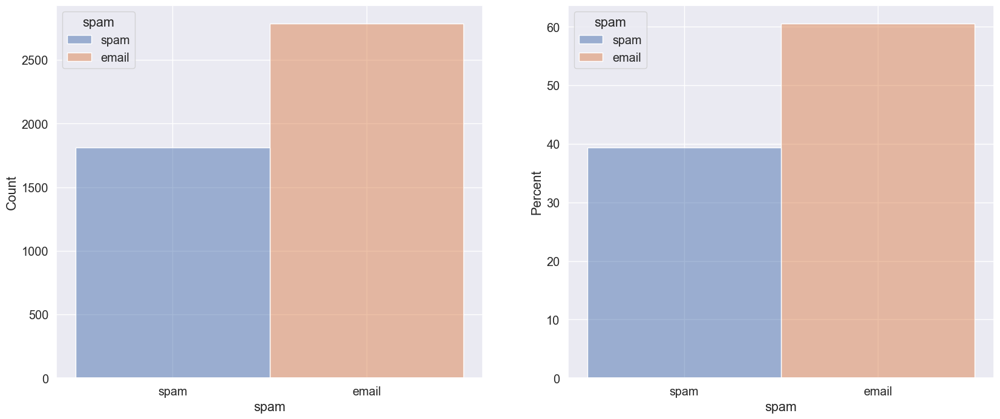

In [126]:
fig,axs = plt.subplots(1,2,figsize = (20,8))
ax = axs.ravel()
sns.histplot(data = df2,x='spam',stat='count'  ,bins=2  ,hue='spam',ax = ax[0])
sns.histplot(data = df2,x='spam',stat='percent',bins=2  ,hue='spam',ax = ax[1])

<AxesSubplot:xlabel='spam', ylabel='word_freq_all'>

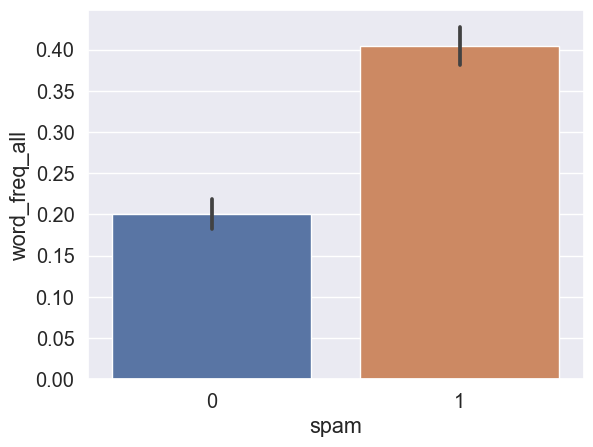

In [76]:
sns.barplot(x='spam', y='word_freq_all', data = df)

## Feature Selection using ANOVA

In [155]:
#Carry out ANOVA for F-Score
data = df.copy()
X = data.iloc[:,0:56]  #independent variable columns
y = data.iloc[:,-1]    #dependent variable column 

#Apply SelectKBest to extract best features
bestfeatures = SelectKBest(score_func = f_classif, k = 8)
fit = bestfeatures.fit(X,y)
dfscores  = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

#Concatenate two dataframes for better visualization 
featureScores = pd.concat([dfcolumns, dfscores], axis = 1)
featureScores.columns = ['Attributes','F-Score']  #naming the resulting dataframe columns
anova_df = pd.DataFrame(featureScores.nlargest(8,'F-Score')).reset_index()
anova_df

,index,Attributes,F-Score
0,20,word_freq_your,791.726012
1,22,word_freq_000,580.534452
2,6,word_freq_remove,570.169634
3,52,char_freq_$,538.029935
4,18,word_freq_you,372.273985
5,15,word_freq_free,342.346240
6,16,word_freq_business,342.316290
7,24,word_freq_hp,324.490814


<AxesSubplot:xlabel='F-Score', ylabel='Percent'>

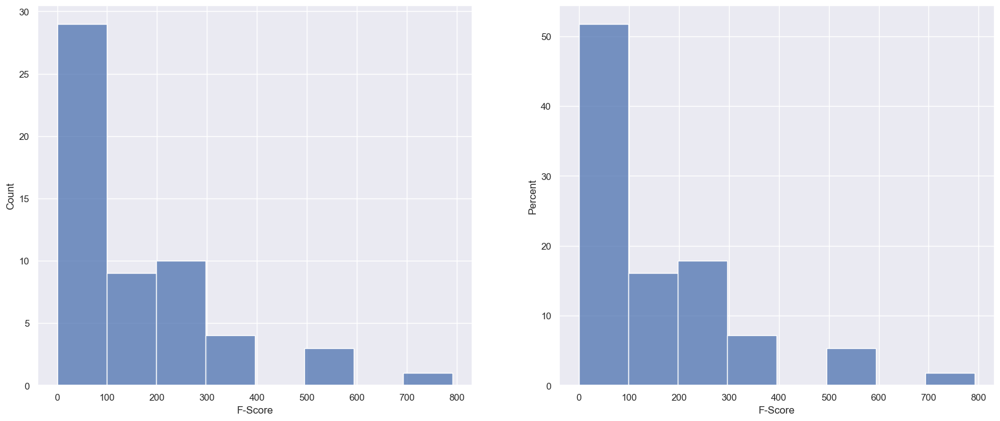

In [153]:
sns.set(rc={'figure.figsize':(12,8)})
fig,axs = plt.subplots(1,2,figsize = (20,8))
ax = axs.ravel()
sns.histplot(data = anova_df , x='F-Score', ax = axs[0])
sns.histplot(data = anova_df , stat = 'percent',x='F-Score', ax = axs[1])

## Checking for correlations

In [156]:
ini_features_list = anova_df['Attributes'].tolist()
reduced_df = df[df.columns.intersection(ini_features_list)]
reduced_df['spam'] = df['spam']
reduced_df

,word_freq_remove,word_freq_free,word_freq_business,word_freq_you,word_freq_your,word_freq_000,word_freq_hp,char_freq_$,spam
0,0.00,0.32,0.00,1.93,0.96,0.00,0.0,0.000,spam
1,0.21,0.14,0.07,3.47,1.59,0.43,0.0,0.180,spam
2,0.19,0.06,0.06,1.36,0.51,1.16,0.0,0.184,spam
3,0.31,0.31,0.00,3.18,0.31,0.00,0.0,0.000,spam
4,0.31,0.31,0.00,3.18,0.31,0.00,0.0,0.000,spam
...,...,...,...,...,...,...,...,...,...
4596,0.00,0.00,0.00,0.62,0.00,0.00,0.0,0.000,email
4597,0.00,0.00,0.00,6.00,2.00,0.00,0.0,0.000,email
4598,0.00,0.00,0.00,1.50,0.30,0.00,0.0,0.000,email
4599,0.00,0.00,0.00,1.93,0.32,0.00,0.0,0.000,email


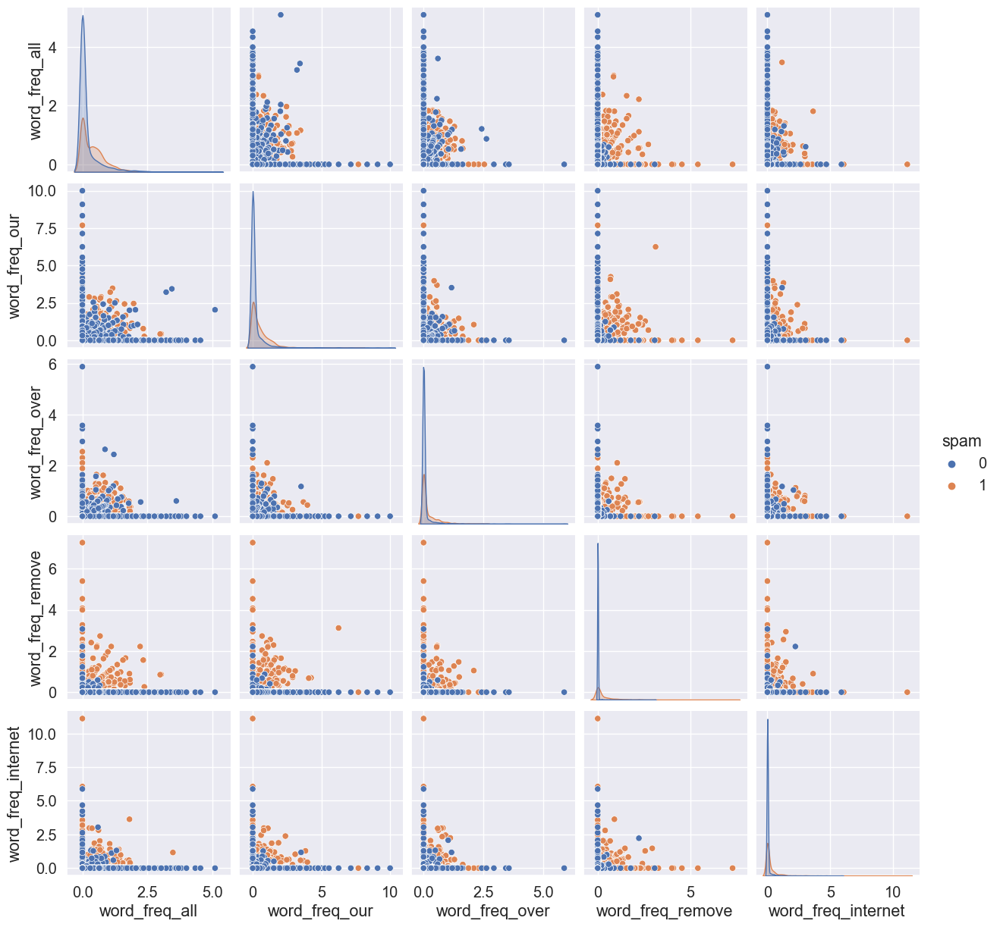

In [54]:
red_red_df = reduced_df.iloc[:,:5]
red_red_df['spam'] = df['spam']
sns.set(font_scale=1.3)
sns.pairplot(red_red_df, hue = 'spam')

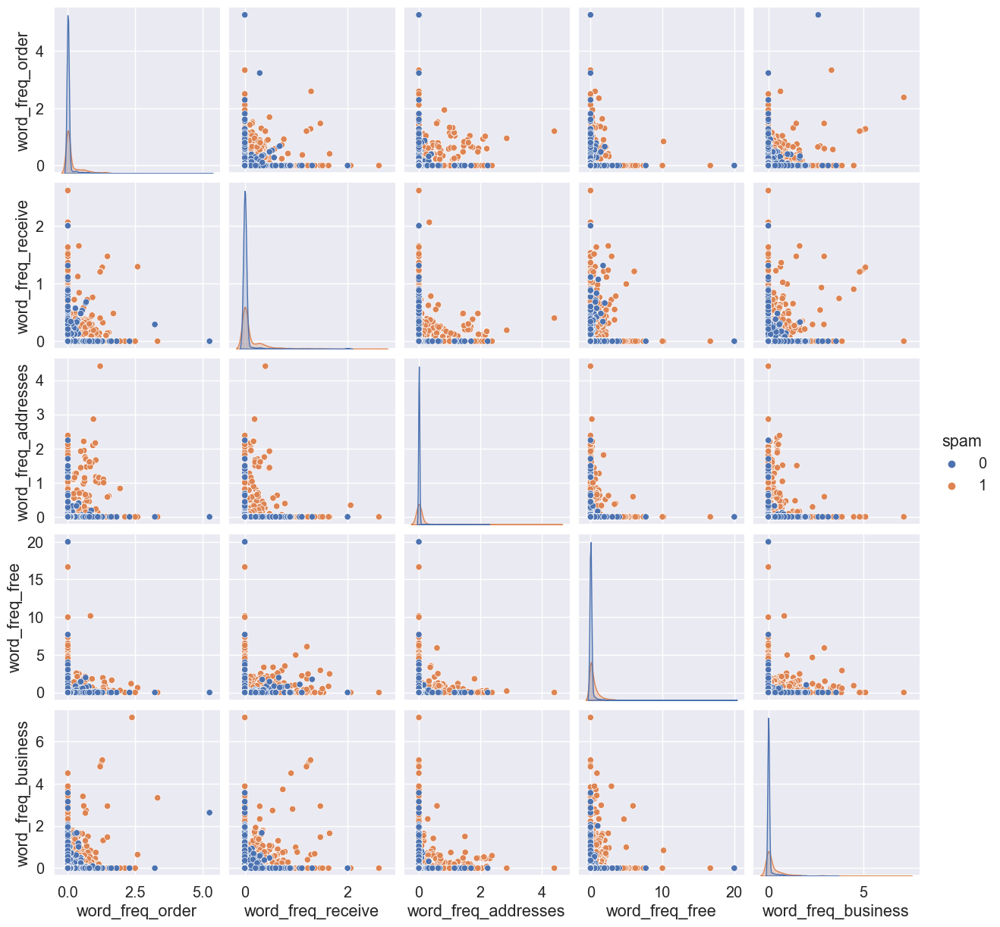

In [57]:
red_red_df = reduced_df.iloc[:,5:10]
red_red_df['spam'] = df['spam']
sns.set(font_scale=1.3)
sns.pairplot(red_red_df, hue = 'spam')

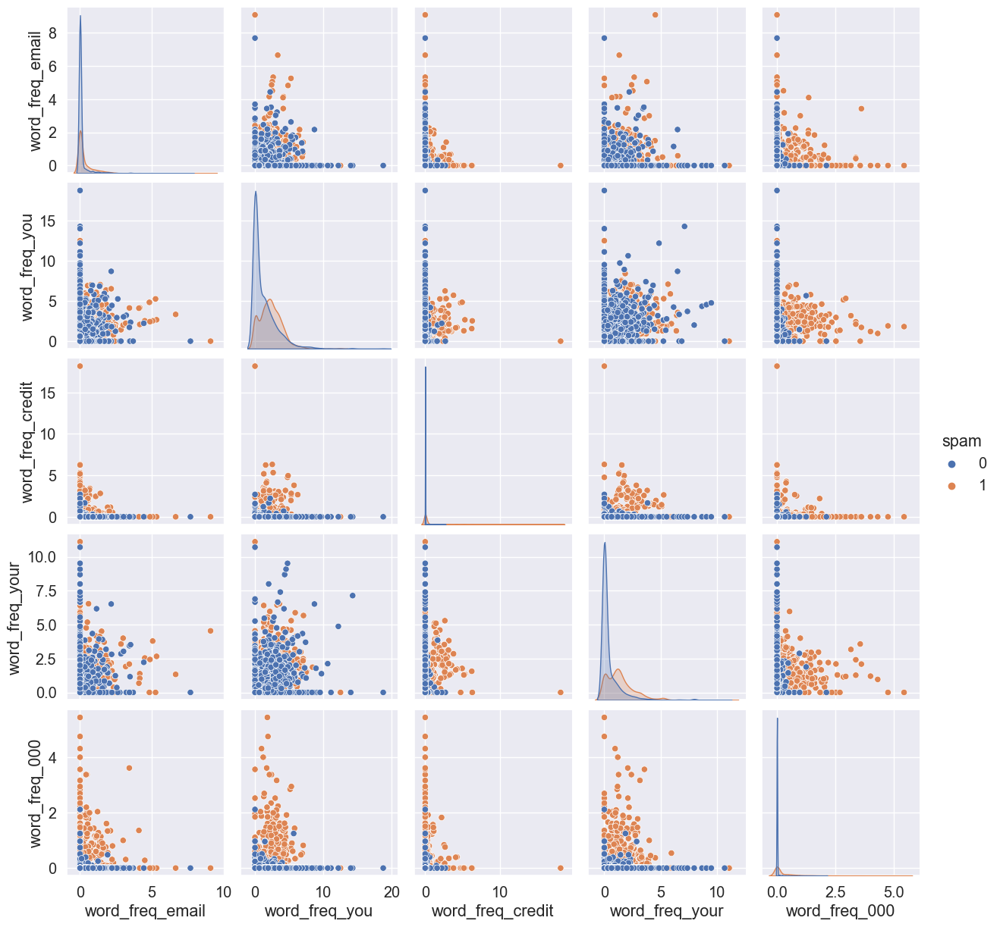

In [63]:
red_red_df = reduced_df.iloc[:,10:15]
red_red_df['spam'] = df['spam']
sns.set(font_scale=1.3)
sns.pairplot(red_red_df, hue = 'spam')

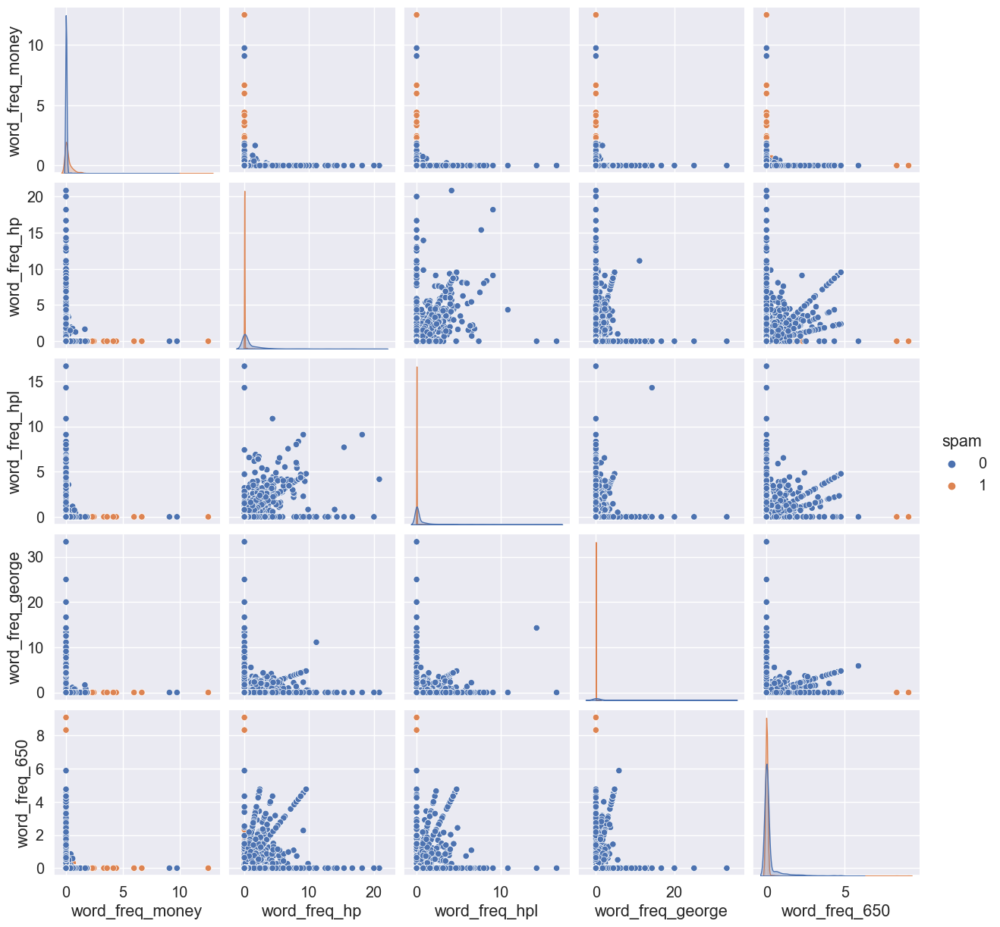

In [60]:
red_red_df = reduced_df.iloc[:,15:20]
red_red_df['spam'] = df['spam']
sns.set(font_scale=1.3)
sns.pairplot(red_red_df, hue = 'spam')

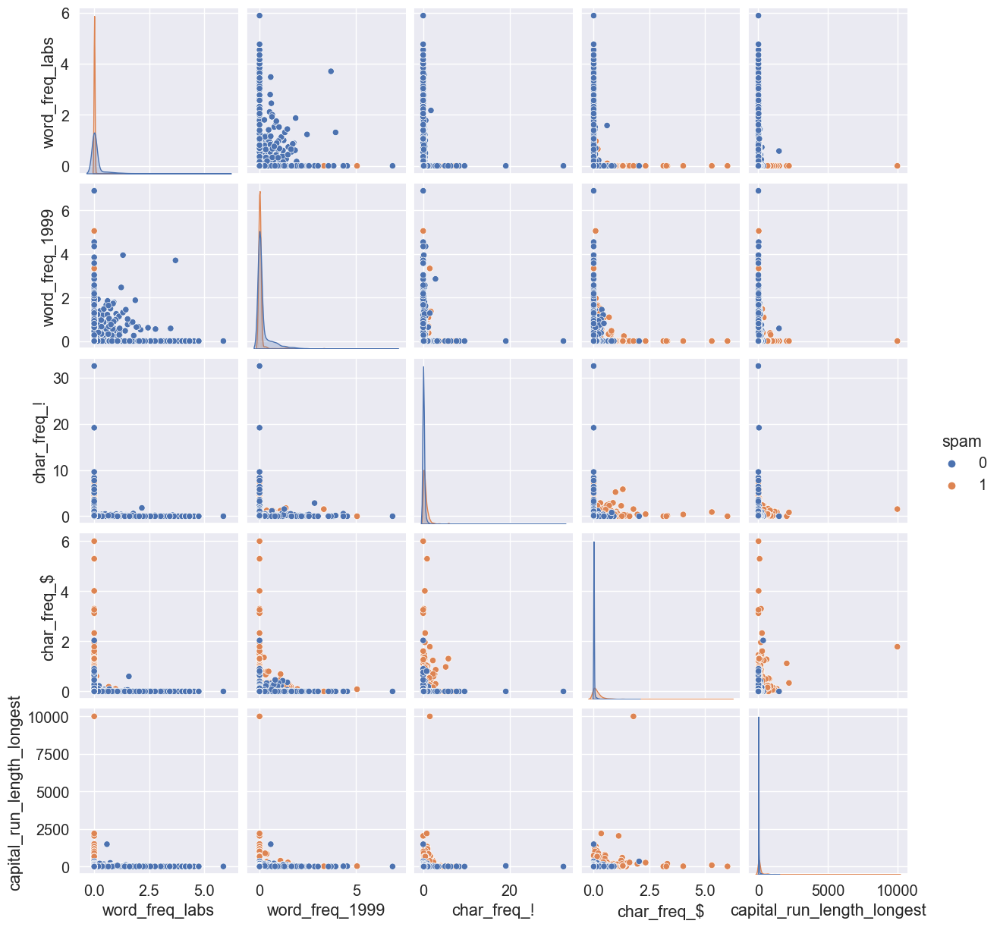

In [61]:
red_red_df = reduced_df.iloc[:,20:25]
red_red_df['spam'] = df['spam']
sns.set(font_scale=1.3)
sns.pairplot(red_red_df, hue = 'spam')

In [157]:
report = ProfileReport(reduced_df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [158]:
report.to_file("eda.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Building the model
Ok, now I have a smaller set of features to work with. This should help with increasing the explainability of the model as well as reducing any overfitting. If the classification accuracy turns out to be very poor with the tested models I'll start to gradually include more features. 

I'll start defining my dependent and independent variables and splitting the dataset

In [159]:
x  = reduced_df.drop(['spam'], axis = 1)
y  = reduced_df['spam']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

In [167]:
def model_assess(X_train, X_test, y_train, y_test, model, title = "Default"):
    
    model.fit(X_train, y_train)
    
    preds_test  = model.predict(X_test)
    preds_train = model.predict(X_train) 
    
    cm = confusion_matrix(y_test, preds_test)
    
    sensitivity = cm[0,0]/(cm[0,0]+cm[1,0])
    specificity = cm[1,1]/(cm[1,1]+cm[0,1])
    
    #print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
    score = round(accuracy_score(y_test, preds_test), 5);
    
    rf_results = pd.DataFrame([title,score,sensitivity,specificity]).transpose()
    rf_results.columns = ['Method','Accuracy Score', 'Sensitivity', 'Specificity']

    return preds_train, preds_test, rf_results, cm

def multi_model_assess(df, models, y_predict):
    all_model_results = [] #This will contain all model results for each dependent variable 
    all_X_test  = []
    all_X_train = []
    all_y_test_p  = []
    all_y_train_p = []
    all_y_train = []
    all_confusion_mats = []
    #First loop will define dependent/independent variables and split data into test/training sets
    n_vars = len(y_predict)
    
    for dependent in y_predict:
        model_results = [] #Array with dataframes for a given dependent variable
        #Designate independent and dependent variables
        x  = df.drop([dependent], axis = 1)
        y  = df[dependent]
        #Split data into test and training sets
        X_train, X_test, y_train, y_test = train_test_split(x, y, 
                                                            test_size = 0.2, 
                                                            )
        
        #Populate the array of observed values for the dependent variable
        all_y_train.append(y_train)
        
        pbar = tqdm(range(len(models)), desc="Variable Processed", position = 0, leave = True)#Add progress bar 
        #Process each of the desired models
        for model, model_name in models:
            if model_name == 'XGBoost':
                le = preprocessing.LabelEncoder()
                le.fit(y_train)
                y_train = le.transform(y_train)
                le.fit(y_test)
                y_test = le.transform(y_test)
                
            y_train_pred,y_test_pred, results = model_assess(X_train, X_test, y_train, y_test, model, title = model_name)
            
            model_results.append(results)
            all_X_test.append(X_test)
            all_X_train.append(X_train)
            all_y_test_p.append(y_test_pred)
            all_y_train_p.append(y_train_pred)
            pbar.update(1)       
        all_model_results.append(model_results)
        #pbar.update(1)
        #pbar.refresh()
        
    pbar.close()   
    return all_model_results, all_X_test, all_X_train, all_y_test_p, all_y_train_p, all_y_train

## Test the Models

In [165]:
lp = Perceptron()
nb = GaussianNB()
rf = RandomForestClassifier()
bg = BaggingClassifier()
xg = XGBClassifier()
kn = KNeighborsClassifier()
dt = DecisionTreeClassifier()
gb = GradientBoostingClassifier()
gp = GaussianProcessClassifier()
sv = SVC()
nn = MLPClassifier()

models =  [(lp,'Perceptron'), 
           (nb,'GaussianNB'), 
           (rf,'Random Forest'), 
           (bg,'Bagging'),
           (xg,'XGBoost'),
           (kn,'K Neighbors'), 
           (dt,'DecisionTree'), 
           (gb,'Gradient Boosting'), 
           (gp,'GaussianProcess'), 
           (sv,'SVC'), 
           (nn,'MLP')]

y_predict  = ['spam']

all_model_results, _, _, all_y_test_p, all_y_train_p, all_y_train = multi_model_assess(reduced_df,
                                                                                       models, 
                                                                                       y_predict)

Variable Processed: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:10<00:00,  1.04it/s]


In [166]:
score_df_results = pd.concat(all_model_results[0],
                ignore_index=True).sort_values('Accuracy Score',axis = 0, ascending = False)
score_df_results

,Method,Training Score,Sensitivity,Specificity
2,Random Forest,0.90988,0.933099,0.872521
4,XGBoost,0.90988,0.924138,0.88563
7,Gradient Boosting,0.90879,0.922547,0.885294
10,MLP,0.90662,0.920826,0.882353
3,Bagging,0.90011,0.914237,0.87574
6,DecisionTree,0.89359,0.914783,0.858382
8,GaussianProcess,0.88382,0.900685,0.854599
5,K Neighbors,0.88274,0.893761,0.862805
9,SVC,0.87405,0.888325,0.848485
1,GaussianNB,0.86211,0.844615,0.904059


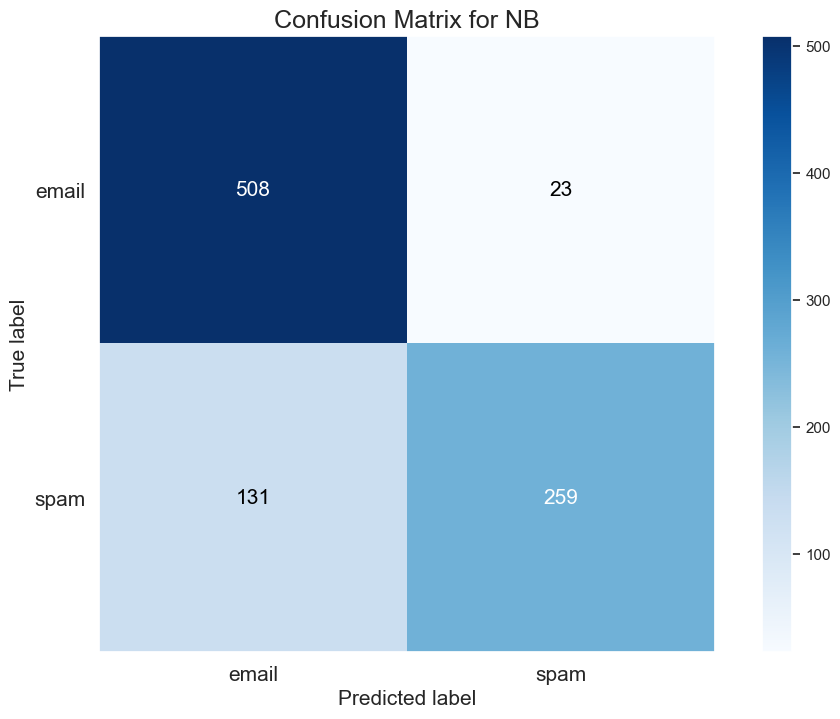

In [181]:
x  = reduced_df.drop(['spam'], axis = 1)
y  = reduced_df['spam']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

nb = GaussianNB()
nb.fit(X_train, y_train)

y_nb_train_pred = nb.predict(X_train) #Predicted y values using training set
y_nb_test_pred  = nb.predict(X_test) #Predicted y values using test set

plt.rcParams.update({'font.size': 15})
skplt.metrics.plot_confusion_matrix(y_test, y_nb_test_pred,
                                    normalize=False, title = 'Confusion Matrix for NB')
plt.show()

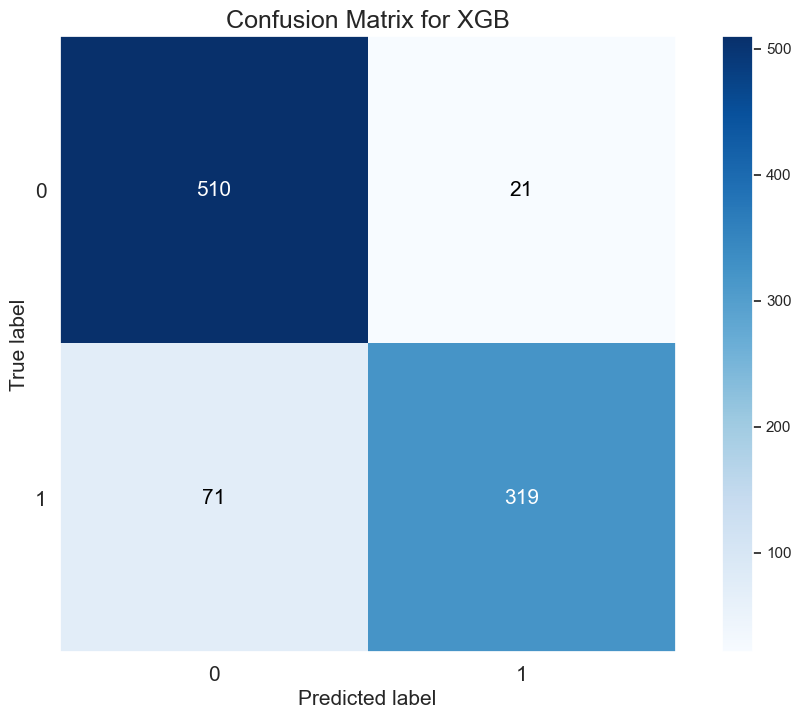

In [183]:
x  = reduced_df.drop(['spam'], axis = 1)
y  = reduced_df['spam']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)
                
xg = XGBClassifier()
xg.fit(X_train, y_train)

y_xg_train_pred = xg.predict(X_train) #Predicted y values using training set
y_xg_test_pred  = xg.predict(X_test) #Predicted y values using test set

plt.rcParams.update({'font.size': 15})
skplt.metrics.plot_confusion_matrix(y_test, y_xg_test_pred,
                                    normalize=False, 
                                    title = 'Confusion Matrix for XGB')
plt.show()

## Initial Grid Search

In [184]:
x  = reduced_df.drop(['spam'], axis = 1)
y  = reduced_df['spam']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)

xg = XGBClassifier()
scoring = ['accuracy','precision', 'recall']

grid_values = {
               'learning_rate':[20,10,5,1,0.5,0.1,0.05,0.01,0.007,0.005,0.003],
               'n_estimators':[10,50,100,150,200,250,300,350,400,450,500],
               'max_depth': [1,2,3,4,5,6,7,8,9,10,11]
              }

grid_clf_acc = GridSearchCV(xg, 
                            param_grid = grid_values, 
                            cv=10,
                            scoring = scoring,
                            refit = 'accuracy',
                            return_train_score=True,
                            verbose = 4,
                            n_jobs = 4)
grid_clf_acc.fit(X_train, y_train)

#Predict values based on new parameters
y_pred_acc = grid_clf_acc.predict(X_test)

# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,y_pred_acc)))
print('Precision Score : ' + str(precision_score(y_test,y_pred_acc)))
print('Recall Score : ' + str(recall_score(y_test,y_pred_acc)))
print('F1 Score : ' + str(f1_score(y_test,y_pred_acc)))

#Logistic Regression (Grid Search) Confusion matrix
confusion_matrix(y_test,y_pred_acc)

Fitting 10 folds for each of 1331 candidates, totalling 13310 fits
Accuracy Score : 0.9033659066232356
Precision Score : 0.9387755102040817
Recall Score : 0.8256410256410256
F1 Score : 0.8785811732605731


array([[510,  21],
       [ 68, 322]], dtype=int64)

In [185]:
cm = confusion_matrix(y_test, y_pred_acc)
    
sensitivity = cm[0,0]/(cm[0,0]+cm[1,0])
specificity = cm[1,1]/(cm[1,1]+cm[0,1])

#print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
score = round(accuracy_score(y_test, y_pred_acc), 5);

rf_results = pd.DataFrame(['XGBoost',score,sensitivity,specificity]).transpose()
rf_results.columns = ['Method','Accuracy Score', 'Sensitivity', 'Specificity']
rf_results

,Method,Accuracy Score,Sensitivity,Specificity
0,XGBoost,0.90337,0.882353,0.938776


<AxesSubplot:title={'center':'Confusion Matrix for GBC'}, xlabel='Predicted label', ylabel='True label'>

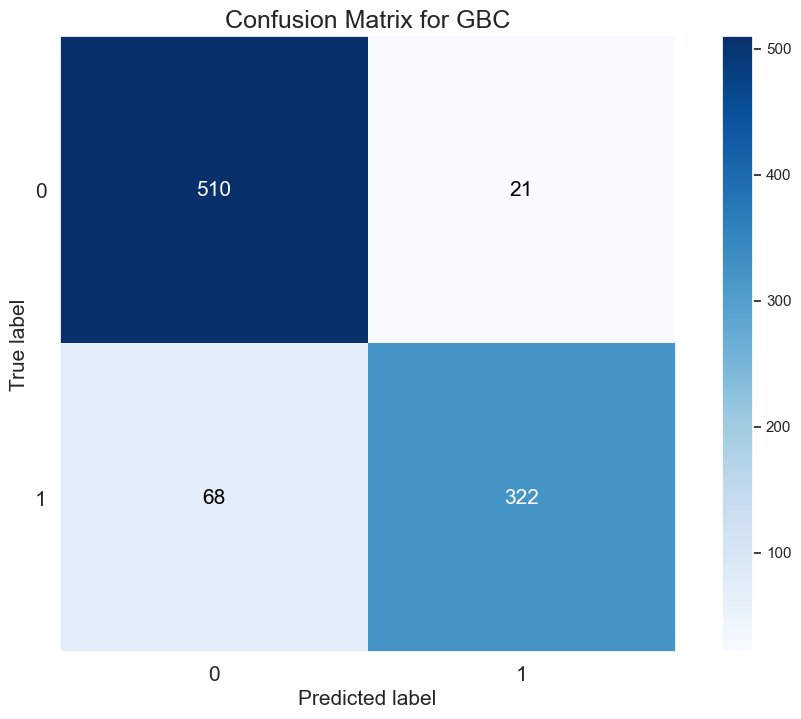

In [186]:
skplt.metrics.plot_confusion_matrix(y_test, y_pred_acc,
                                    normalize=False, title = 'Confusion Matrix for GBC')

In [187]:
df_gridsearch = pd.DataFrame(grid_clf_acc.cv_results_)
df_gridsearch.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,params,split0_test_accuracy,split1_test_accuracy,...,split2_train_recall,split3_train_recall,split4_train_recall,split5_train_recall,split6_train_recall,split7_train_recall,split8_train_recall,split9_train_recall,mean_train_recall,std_train_recall
0,0.039984,0.037506,0.004203,0.000332,20,1,10,"{'learning_rate': 20, 'max_depth': 1, 'n_estim...",0.793478,0.80163,...,0.557031,0.579235,0.551132,0.558938,0.563622,0.583919,0.56128,0.57377,0.566408,0.01063
1,0.023170,0.001416,0.004053,0.000350,20,1,50,"{'learning_rate': 20, 'max_depth': 1, 'n_estim...",0.793478,0.80163,...,0.557031,0.579235,0.551132,0.558938,0.563622,0.583919,0.56128,0.57377,0.566408,0.01063
2,0.035430,0.002085,0.003803,0.000245,20,1,100,"{'learning_rate': 20, 'max_depth': 1, 'n_estim...",0.793478,0.80163,...,0.557031,0.579235,0.551132,0.558938,0.563622,0.583919,0.56128,0.57377,0.566408,0.01063
3,0.049142,0.001815,0.003853,0.000229,20,1,150,"{'learning_rate': 20, 'max_depth': 1, 'n_estim...",0.793478,0.80163,...,0.557031,0.579235,0.551132,0.558938,0.563622,0.583919,0.56128,0.57377,0.566408,0.01063
4,0.063654,0.001672,0.003853,0.000229,20,1,200,"{'learning_rate': 20, 'max_depth': 1, 'n_estim...",0.793478,0.80163,...,0.557031,0.579235,0.551132,0.558938,0.563622,0.583919,0.56128,0.57377,0.566408,0.01063


In [189]:
df_gridsearch.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_learning_rate', 'param_max_depth', 'param_n_estimators',
       'params', 'split0_test_accuracy', 'split1_test_accuracy',
       'split2_test_accuracy', 'split3_test_accuracy', 'split4_test_accuracy',
       'split5_test_accuracy', 'split6_test_accuracy', 'split7_test_accuracy',
       'split8_test_accuracy', 'split9_test_accuracy', 'mean_test_accuracy',
       'std_test_accuracy', 'rank_test_accuracy', 'split0_train_accuracy',
       'split1_train_accuracy', 'split2_train_accuracy',
       'split3_train_accuracy', 'split4_train_accuracy',
       'split5_train_accuracy', 'split6_train_accuracy',
       'split7_train_accuracy', 'split8_train_accuracy',
       'split9_train_accuracy', 'mean_train_accuracy', 'std_train_accuracy',
       'split0_test_precision', 'split1_test_precision',
       'split2_test_precision', 'split3_test_precision',
       'split4_test_precision', 'split5_test_precision',
 

In [190]:
df_gridsearch['mean_train_accuracy'].max()

0.9759359903381644

In [191]:
params = grid_clf_acc.get_params()
params

{'cv': 10,
 'error_score': nan,
 'estimator__objective': 'binary:logistic',
 'estimator__use_label_encoder': False,
 'estimator__base_score': None,
 'estimator__booster': None,
 'estimator__callbacks': None,
 'estimator__colsample_bylevel': None,
 'estimator__colsample_bynode': None,
 'estimator__colsample_bytree': None,
 'estimator__early_stopping_rounds': None,
 'estimator__enable_categorical': False,
 'estimator__eval_metric': None,
 'estimator__gamma': None,
 'estimator__gpu_id': None,
 'estimator__grow_policy': None,
 'estimator__importance_type': None,
 'estimator__interaction_constraints': None,
 'estimator__learning_rate': None,
 'estimator__max_bin': None,
 'estimator__max_cat_to_onehot': None,
 'estimator__max_delta_step': None,
 'estimator__max_depth': None,
 'estimator__max_leaves': None,
 'estimator__min_child_weight': None,
 'estimator__missing': nan,
 'estimator__monotone_constraints': None,
 'estimator__n_estimators': 100,
 'estimator__n_jobs': None,
 'estimator__num_pa

In [192]:
fin_params = grid_clf_acc.best_params_
fin_params

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}

The AUC is  0.8930465015210778


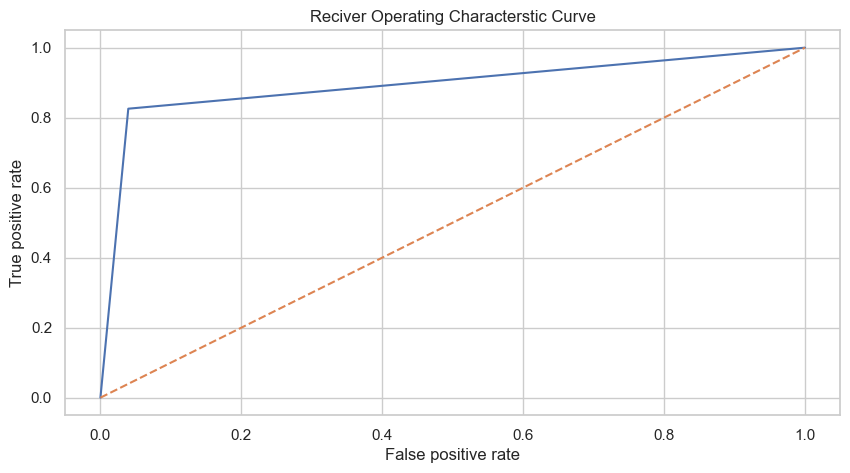

In [193]:
fpr, tpr, thresholds  = roc_curve(y_test,y_pred_acc)
print("The AUC is ",auc(fpr, tpr))
sns.set_style('whitegrid')
plt.figure(figsize=(10,5))
plt.title('Reciver Operating Characterstic Curve')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.plot(fpr,tpr,label='XGB Classifier')
plt.plot([0,1],ls='--')
plt.show()

Accuracy Score : 0.9207383279044516
Precision Score : 0.9219219219219219
Recall Score : 0.867231638418079
F1 Score : 0.893740902474527


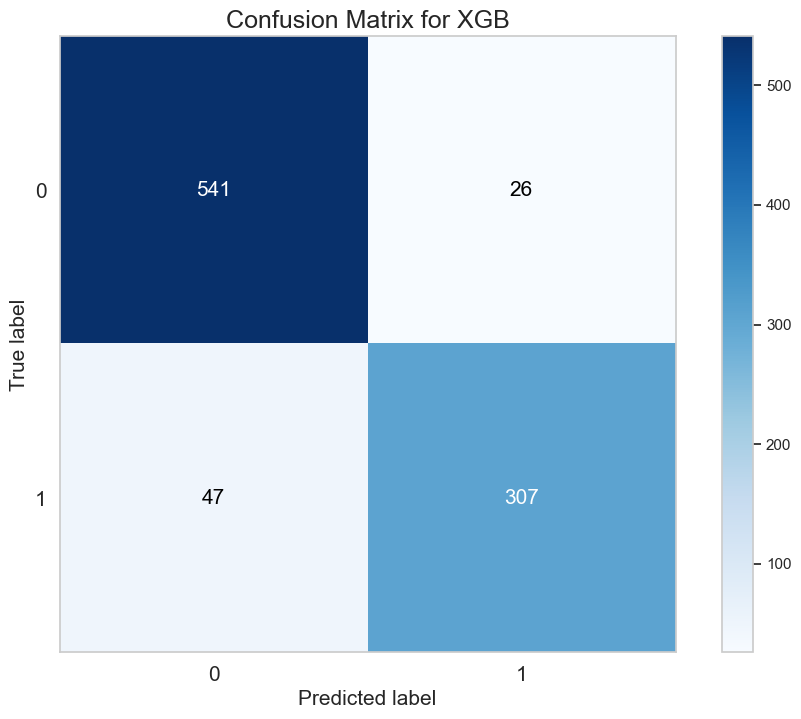

In [195]:
y_predict  = ['spam']

compound = y_predict[0]
#Designate independent and dependent variables
x  = reduced_df.drop([compound], axis = 1)
y  = reduced_df[compound]
#Split data into test and training sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)

xgb_model = GradientBoostingClassifier(**grid_clf_acc.best_params_)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)

# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,xgb_predictions)))
print('Precision Score : ' + str(precision_score(y_test,xgb_predictions)))
print('Recall Score : ' + str(recall_score(y_test,xgb_predictions)))
print('F1 Score : ' + str(f1_score(y_test,xgb_predictions)))

#Logistic Regression (Grid Search) Confusion matrix
#confusion_matrix(y_test,y_pred_acc)
plt.rcParams.update({'font.size': 15})
skplt.metrics.plot_confusion_matrix(y_test, xgb_predictions,
                                    normalize=False, title = 'Confusion Matrix for XGB')
plt.show()

In [196]:
cm = confusion_matrix(y_test, xgb_predictions)
    
sensitivity = cm[0,0]/(cm[0,0]+cm[1,0])
specificity = cm[1,1]/(cm[1,1]+cm[0,1])

In [197]:
print(sensitivity,specificity)

0.9200680272108843 0.9219219219219219


## Optimizing the ROC AUC Curve

In [220]:
x  = reduced_df.drop(['spam'], axis = 1)
y  = reduced_df['spam']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)

xg2 = XGBClassifier()

scoring = ['accuracy','roc_auc']

grid_values = {
               'learning_rate':[1,0.5,0.1,0.05,0.01],
               'n_estimators':[200,250,300,350,400],
               'max_depth': [3,4,5,6,7]
              }

grid_clf_acc2 = GridSearchCV(xg2, 
                            param_grid = grid_values, 
                            cv=5,
                            scoring = scoring,
                            refit = 'accuracy',
                            return_train_score=True,
                            verbose = 4,
                            n_jobs = 4)
grid_clf_acc2.fit(X_train, y_train)

#Predict values based on new parameters
y_pred_acc = grid_clf_acc2.predict(X_test)

# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,y_pred_acc)))
print('Precision Score : ' + str(precision_score(y_test,y_pred_acc)))
print('Recall Score : ' + str(recall_score(y_test,y_pred_acc)))
print('F1 Score : ' + str(f1_score(y_test,y_pred_acc)))

#Logistic Regression (Grid Search) Confusion matrix
confusion_matrix(y_test,y_pred_acc)

Fitting 5 folds for each of 125 candidates, totalling 625 fits
Accuracy Score : 0.8979370249728555
Precision Score : 0.8911764705882353
Recall Score : 0.8416666666666667
F1 Score : 0.8657142857142858


array([[524,  37],
       [ 57, 303]], dtype=int64)

In [221]:
cm = confusion_matrix(y_test, y_pred_acc)
    
sensitivity = cm[0,0]/(cm[0,0]+cm[1,0])
specificity = cm[1,1]/(cm[1,1]+cm[0,1])

#print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
score = round(accuracy_score(y_test, y_pred_acc), 5);

rf_results = pd.DataFrame(['XGBoost',score,sensitivity,specificity]).transpose()
rf_results.columns = ['Method','Accuracy Score', 'Sensitivity', 'Specificity']
rf_results

,Method,Accuracy Score,Sensitivity,Specificity
0,XGBoost,0.89794,0.901893,0.891176


<AxesSubplot:title={'center':'Confusion Matrix for GBC'}, xlabel='Predicted label', ylabel='True label'>

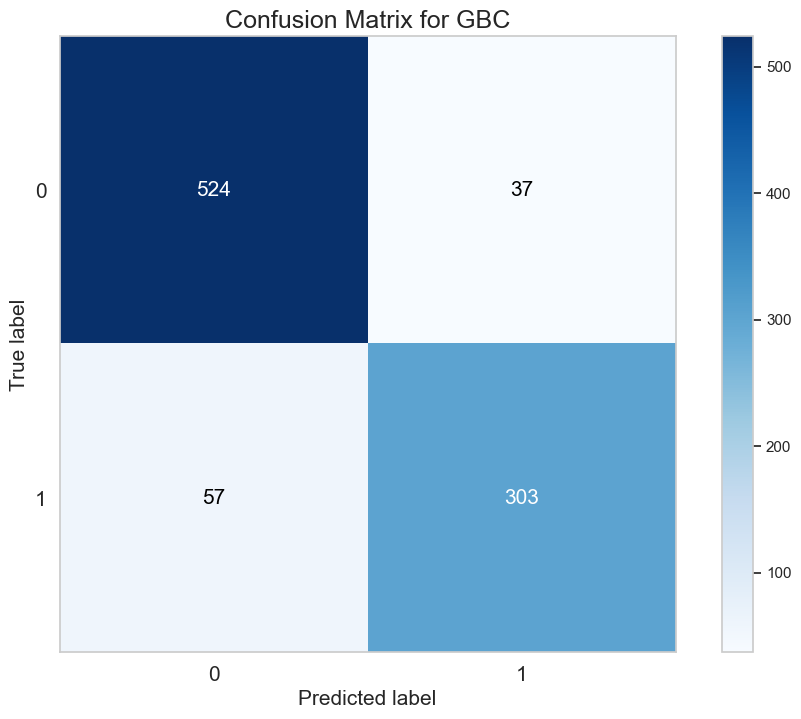

In [222]:
skplt.metrics.plot_confusion_matrix(y_test, y_pred_acc,
                                    normalize=False, title = 'Confusion Matrix for GBC')

In [223]:
df_gridsearch = pd.DataFrame(grid_clf_acc2.cv_results_)
df_gridsearch.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,params,split0_test_accuracy,split1_test_accuracy,...,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,split0_train_roc_auc,split1_train_roc_auc,split2_train_roc_auc,split3_train_roc_auc,split4_train_roc_auc,mean_train_roc_auc,std_train_roc_auc
0,0.170546,0.026171,0.007106,0.000584,1,3,200,"{'learning_rate': 1, 'max_depth': 3, 'n_estima...",0.896739,0.903533,...,0.947558,0.007800,100,0.991364,0.989799,0.991130,0.991393,0.990140,0.990765,0.000665
1,0.162139,0.008845,0.006806,0.000245,1,3,250,"{'learning_rate': 1, 'max_depth': 3, 'n_estima...",0.899457,0.902174,...,0.947432,0.007138,102,0.991943,0.990798,0.991932,0.992320,0.991316,0.991662,0.000539
2,0.201473,0.002402,0.007106,0.000374,1,3,300,"{'learning_rate': 1, 'max_depth': 3, 'n_estima...",0.892663,0.903533,...,0.946745,0.007695,110,0.992553,0.991795,0.992622,0.992762,0.992010,0.992348,0.000376
3,0.219588,0.002520,0.007206,0.000245,1,3,350,"{'learning_rate': 1, 'max_depth': 3, 'n_estima...",0.891304,0.900815,...,0.946968,0.007048,105,0.993132,0.992345,0.993074,0.993229,0.992465,0.992849,0.000368
4,0.243408,0.005807,0.007607,0.000200,1,3,400,"{'learning_rate': 1, 'max_depth': 3, 'n_estima...",0.885870,0.903533,...,0.946380,0.007366,114,0.993435,0.992592,0.993386,0.993596,0.993029,0.993207,0.000359


In [224]:
df_gridsearch.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_learning_rate', 'param_max_depth', 'param_n_estimators',
       'params', 'split0_test_accuracy', 'split1_test_accuracy',
       'split2_test_accuracy', 'split3_test_accuracy', 'split4_test_accuracy',
       'mean_test_accuracy', 'std_test_accuracy', 'rank_test_accuracy',
       'split0_train_accuracy', 'split1_train_accuracy',
       'split2_train_accuracy', 'split3_train_accuracy',
       'split4_train_accuracy', 'mean_train_accuracy', 'std_train_accuracy',
       'split0_test_roc_auc', 'split1_test_roc_auc', 'split2_test_roc_auc',
       'split3_test_roc_auc', 'split4_test_roc_auc', 'mean_test_roc_auc',
       'std_test_roc_auc', 'rank_test_roc_auc', 'split0_train_roc_auc',
       'split1_train_roc_auc', 'split2_train_roc_auc', 'split3_train_roc_auc',
       'split4_train_roc_auc', 'mean_train_roc_auc', 'std_train_roc_auc'],
      dtype='object')

In [226]:
df_gridsearch['mean_train_accuracy'].max()

0.9775135869565217

In [227]:
fin_params = grid_clf_acc2.best_params_
fin_params

{'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 400}

Accuracy Score : 0.9033659066232356
Precision Score : 0.9213483146067416
Recall Score : 0.8431876606683805
F1 Score : 0.8805369127516779


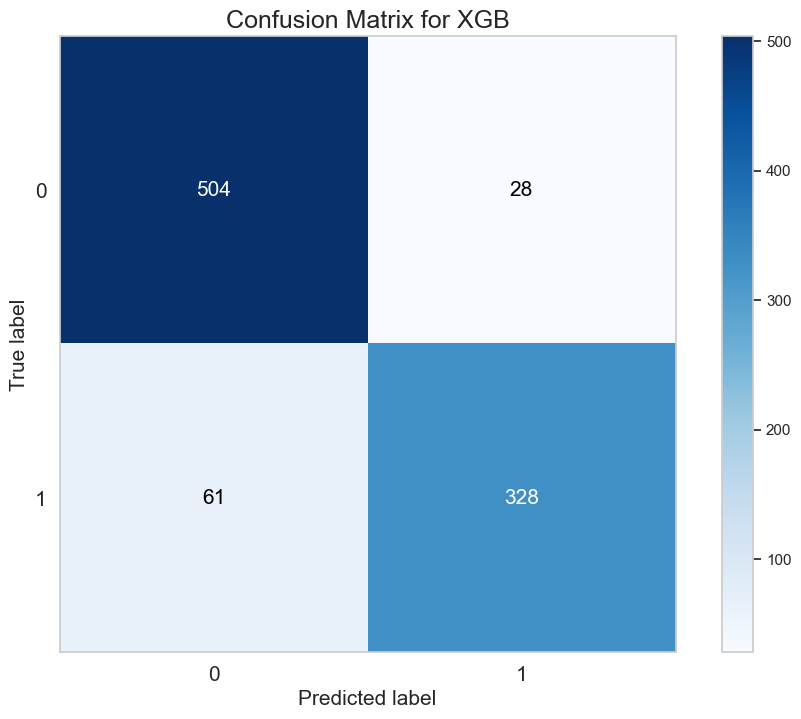

In [228]:
y_predict  = ['spam']

compound = y_predict[0]
#Designate independent and dependent variables
x  = reduced_df.drop([compound], axis = 1)
y  = reduced_df[compound]
#Split data into test and training sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)

xgb_model = GradientBoostingClassifier(**grid_clf_acc2.best_params_)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)

# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,xgb_predictions)))
print('Precision Score : ' + str(precision_score(y_test,xgb_predictions)))
print('Recall Score : ' + str(recall_score(y_test,xgb_predictions)))
print('F1 Score : ' + str(f1_score(y_test,xgb_predictions)))

#Logistic Regression (Grid Search) Confusion matrix
#confusion_matrix(y_test,y_pred_acc)
plt.rcParams.update({'font.size': 15})
skplt.metrics.plot_confusion_matrix(y_test, xgb_predictions,
                                    normalize=False, title = 'Confusion Matrix for XGB')
plt.show()

The AUC is  0.895278040860506


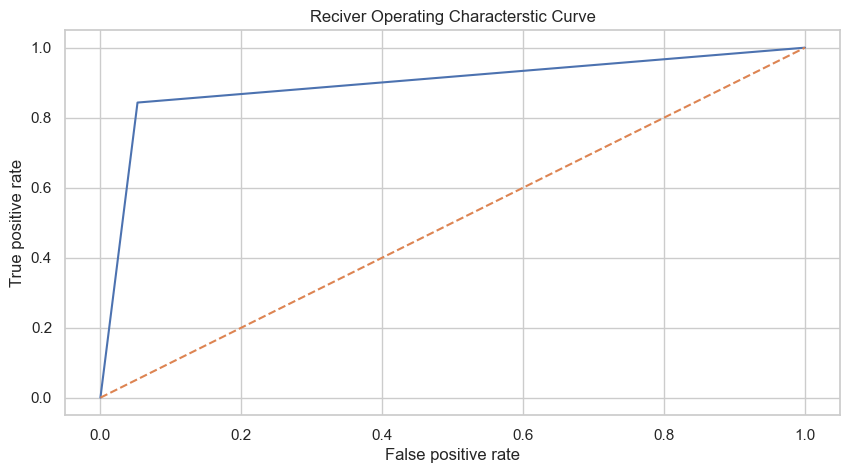

In [229]:
fpr, tpr, thresholds  = roc_curve(y_test,xgb_predictions)
print("The AUC is ",auc(fpr, tpr))
sns.set_style('whitegrid')
plt.figure(figsize=(10,5))
plt.title('Reciver Operating Characterstic Curve')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.plot(fpr,tpr,label='XGB Classifier')
plt.plot([0,1],ls='--')
plt.show()

## Increasing dimensionality of model

In [231]:
#Carry out ANOVA for F-Score
data = df.copy()
X = data.iloc[:,0:56]  #independent variable columns
y = data.iloc[:,-1]    #dependent variable column 

#Apply SelectKBest to extract best features
bestfeatures = SelectKBest(score_func = f_classif, k = 30)
fit = bestfeatures.fit(X,y)
dfscores  = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

#Concatenate two dataframes for better visualization 
featureScores = pd.concat([dfcolumns, dfscores], axis = 1)
featureScores.columns = ['Attributes','F-Score']  #naming the resulting dataframe columns
anova_df = pd.DataFrame(featureScores.nlargest(18,'F-Score')).reset_index()
anova_df

,index,Attributes,F-Score
0,20,word_freq_your,791.726012
1,22,word_freq_000,580.534452
2,6,word_freq_remove,570.169634
3,52,char_freq_$,538.029935
4,18,word_freq_you,372.273985
5,15,word_freq_free,342.346240
6,16,word_freq_business,342.316290
7,24,word_freq_hp,324.490814
8,4,word_freq_our,285.890659
9,51,char_freq_!,285.810155


In [232]:
ini_features_list = anova_df['Attributes'].tolist()
reduced_df = df[df.columns.intersection(ini_features_list)]
reduced_df['spam'] = df['spam']
reduced_df

,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_receive,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_your,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,char_freq_!,char_freq_$,capital_run_length_longest,spam
0,0.32,0.00,0.00,0.00,0.00,0.00,0.32,0.00,1.29,1.93,0.96,0.00,0.00,0.0,0.0,0.778,0.000,61,spam
1,0.14,0.28,0.21,0.07,0.00,0.21,0.14,0.07,0.28,3.47,1.59,0.43,0.43,0.0,0.0,0.372,0.180,101,spam
2,1.23,0.19,0.19,0.12,0.64,0.38,0.06,0.06,1.03,1.36,0.51,1.16,0.06,0.0,0.0,0.276,0.184,485,spam
3,0.63,0.00,0.31,0.63,0.31,0.31,0.31,0.00,0.00,3.18,0.31,0.00,0.00,0.0,0.0,0.137,0.000,40,spam
4,0.63,0.00,0.31,0.63,0.31,0.31,0.31,0.00,0.00,3.18,0.31,0.00,0.00,0.0,0.0,0.135,0.000,40,spam
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4596,0.00,0.31,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.62,0.00,0.00,0.00,0.0,0.0,0.000,0.000,3,email
4597,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.00,2.00,0.00,0.00,0.0,0.0,0.353,0.000,4,email
4598,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.90,1.50,0.30,0.00,0.00,0.0,0.0,0.000,0.000,6,email
4599,0.32,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.93,0.32,0.00,0.00,0.0,0.0,0.000,0.000,5,email


Accuracy Score : 0.9337676438653637
Precision Score : 0.9433962264150944
Recall Score : 0.8974358974358975
F1 Score : 0.9198423127463863


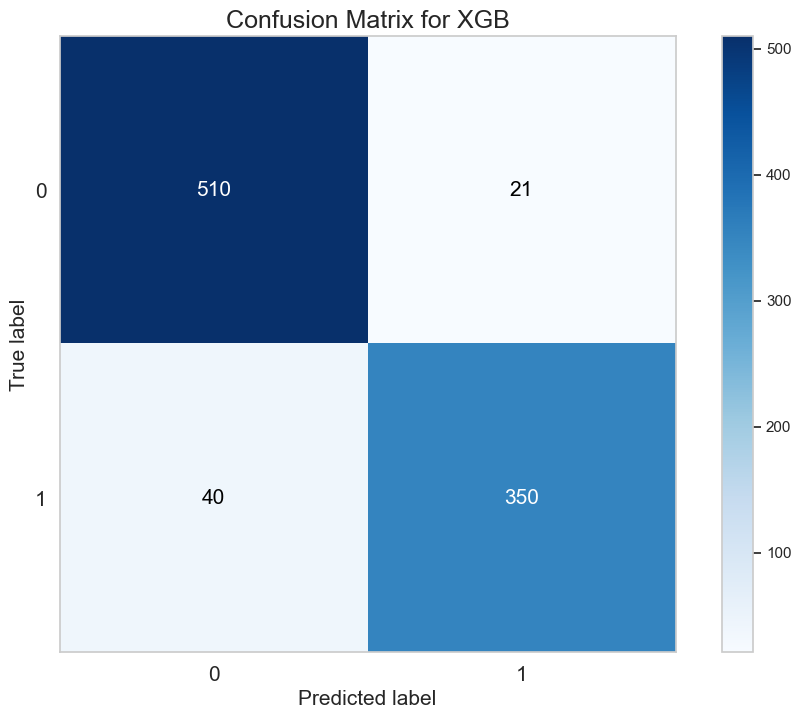

In [234]:
x  = reduced_df.drop(['spam'], axis = 1)
y  = reduced_df['spam']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)
                
xg = XGBClassifier()
xg.fit(X_train, y_train)

y_xg_train_pred = xg.predict(X_train) #Predicted y values using training set
y_xg_test_pred  = xg.predict(X_test) #Predicted y values using test set

# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,y_xg_test_pred)))
print('Precision Score : ' + str(precision_score(y_test,y_xg_test_pred)))
print('Recall Score : ' + str(recall_score(y_test,y_xg_test_pred)))
print('F1 Score : ' + str(f1_score(y_test,y_xg_test_pred)))

plt.rcParams.update({'font.size': 15})
skplt.metrics.plot_confusion_matrix(y_test, y_xg_test_pred,
                                    normalize=False, 
                                    title = 'Confusion Matrix for XGB')
plt.show()

In [235]:
cm = confusion_matrix(y_test, y_xg_test_pred)
    
sensitivity = cm[0,0]/(cm[0,0]+cm[1,0])
specificity = cm[1,1]/(cm[1,1]+cm[0,1])

#print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
score = round(accuracy_score(y_test, y_xg_test_pred), 5);

rf_results = pd.DataFrame(['XGBoost',score,sensitivity,specificity]).transpose()
rf_results.columns = ['Method','Accuracy Score', 'Sensitivity', 'Specificity']
rf_results

,Method,Accuracy Score,Sensitivity,Specificity
0,XGBoost,0.93377,0.927273,0.943396


In [236]:
x  = reduced_df.drop(['spam'], axis = 1)
y  = reduced_df['spam']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)

xg3 = XGBClassifier()

scoring = ['accuracy','roc_auc']

grid_values = {
               'learning_rate':[1,0.5,0.1,0.05,0.01],
               'n_estimators':[200,250,300,350,400],
               'max_depth': [3,4,5,6,7]
              }

grid_clf_acc3 = GridSearchCV(xg3, 
                            param_grid = grid_values, 
                            cv=5,
                            scoring = scoring,
                            refit = 'accuracy',
                            return_train_score=True,
                            verbose = 4,
                            n_jobs = 4)
grid_clf_acc3.fit(X_train, y_train)

#Predict values based on new parameters
y_pred_acc = grid_clf_acc3.predict(X_test)

# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,y_pred_acc)))
print('Precision Score : ' + str(precision_score(y_test,y_pred_acc)))
print('Recall Score : ' + str(recall_score(y_test,y_pred_acc)))
print('F1 Score : ' + str(f1_score(y_test,y_pred_acc)))

#Logistic Regression (Grid Search) Confusion matrix
confusion_matrix(y_test,y_pred_acc)

Fitting 5 folds for each of 125 candidates, totalling 625 fits
Accuracy Score : 0.9391965255157437
Precision Score : 0.9385964912280702
Recall Score : 0.901685393258427
F1 Score : 0.9197707736389685


array([[544,  21],
       [ 35, 321]], dtype=int64)

In [237]:
cm = confusion_matrix(y_test, y_pred_acc)
    
sensitivity = cm[0,0]/(cm[0,0]+cm[1,0])
specificity = cm[1,1]/(cm[1,1]+cm[0,1])

#print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
score = round(accuracy_score(y_test, y_pred_acc), 5);

rf_results = pd.DataFrame(['XGBoost',score,sensitivity,specificity]).transpose()
rf_results.columns = ['Method','Accuracy Score', 'Sensitivity', 'Specificity']
rf_results

,Method,Accuracy Score,Sensitivity,Specificity
0,XGBoost,0.9392,0.939551,0.938596


In [238]:
df_gridsearch['mean_train_accuracy'].max()

0.9775135869565217

In [239]:
fin_params = grid_clf_acc3.best_params_
fin_params

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 350}

Accuracy Score : 0.9185667752442996
Precision Score : 0.923728813559322
Recall Score : 0.872
F1 Score : 0.8971193415637859


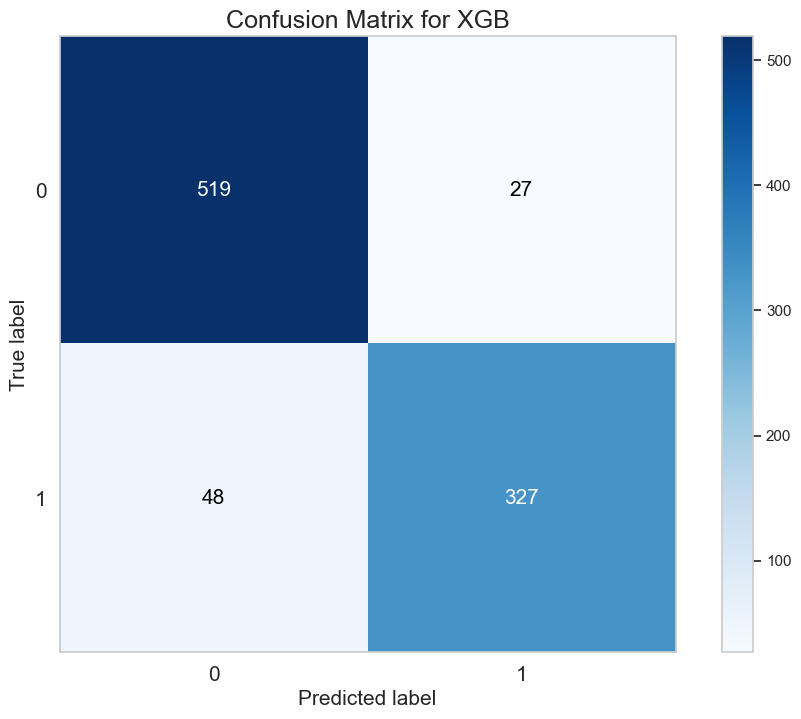

In [240]:
y_predict  = ['spam']

compound = y_predict[0]
#Designate independent and dependent variables
x  = reduced_df.drop([compound], axis = 1)
y  = reduced_df[compound]
#Split data into test and training sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)

xgb_model = GradientBoostingClassifier(**grid_clf_acc3.best_params_)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)

# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,xgb_predictions)))
print('Precision Score : ' + str(precision_score(y_test,xgb_predictions)))
print('Recall Score : ' + str(recall_score(y_test,xgb_predictions)))
print('F1 Score : ' + str(f1_score(y_test,xgb_predictions)))

#Logistic Regression (Grid Search) Confusion matrix
#confusion_matrix(y_test,y_pred_acc)
plt.rcParams.update({'font.size': 15})
skplt.metrics.plot_confusion_matrix(y_test, xgb_predictions,
                                    normalize=False, title = 'Confusion Matrix for XGB')
plt.show()

In [247]:
import plotly.express as px
df_gridsearch['std_test_score_display'] = df_gridsearch['std_test_accuracy']**0.5
fig = px.scatter_3d(df_gridsearch,
                    x='param_learning_rate',
                    log_x = True,
                    y='param_n_estimators',
                    z='param_max_depth',
                    color= 'mean_test_accuracy',
                    color_continuous_scale=px.colors.sequential.haline,
                    size = 'std_test_accuracy',
                    range_color = (0.898,0.91),
                    size_max = 40)

fig.update_layout(title="Grid Search Exploration for XGBoost Classifier", autosize=False,
                  width=700, height=700,
                  margin=dict(l=30, r=50, b=30, t=90),
                 )

fig.write_html("gridsearch1.html")
fig.show()

In [248]:
y_predict  = ['spam']

compound = y_predict[0]
#Designate independent and dependent variables
x  = reduced_df.drop([compound], axis = 1)
y  = reduced_df[compound]
#Split data into test and training sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2)

le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
le.fit(y_test)
y_test = le.transform(y_test)

xgb_model = GradientBoostingClassifier(**grid_clf_acc3.best_params_)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)

# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,xgb_predictions)))
print('Precision Score : ' + str(precision_score(y_test,xgb_predictions)))
print('Recall Score : ' + str(recall_score(y_test,xgb_predictions)))
print('F1 Score : ' + str(f1_score(y_test,xgb_predictions)))

Accuracy Score : 0.9424538545059717
Precision Score : 0.9382716049382716
Recall Score : 0.9020771513353115
F1 Score : 0.9198184568835098


In [249]:
perm = PermutationImportance(xgb_model, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0580 ± 0.0062,word_freq_hp
0.0508 ± 0.0124,word_freq_remove
0.0497 ± 0.0105,capital_run_length_longest
0.0311 ± 0.0136,char_freq_!
0.0198 ± 0.0076,char_freq_$
0.0098 ± 0.0036,word_freq_our
0.0091 ± 0.0094,word_freq_free
0.0067 ± 0.0032,word_freq_money
0.0063 ± 0.0066,word_freq_000
0.0054 ± 0.0039,word_freq_your


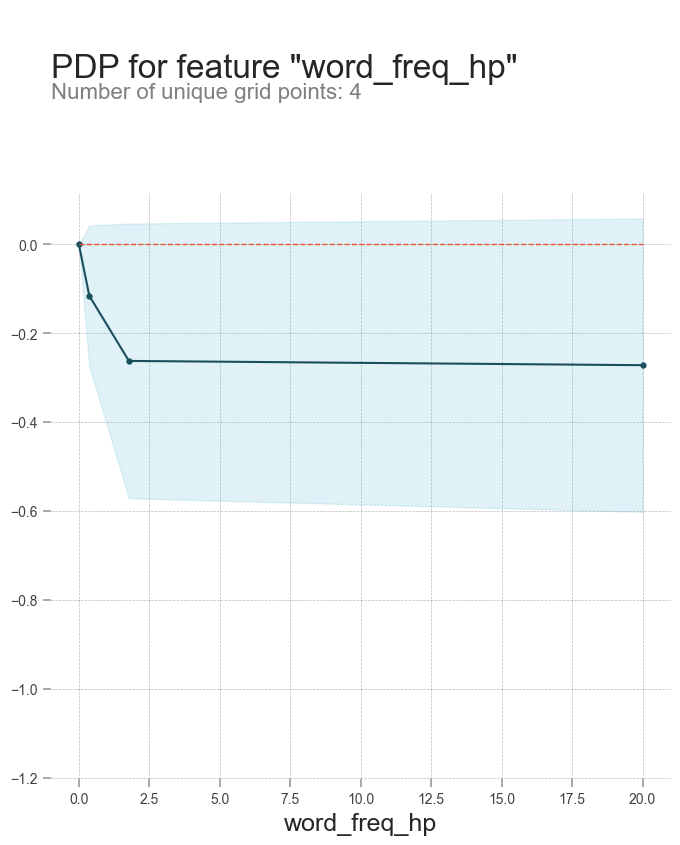

In [250]:
base_features = reduced_df.columns.values.tolist()
base_features.remove('spam')

feat_name = 'word_freq_hp'
pdp_dist = pdp.pdp_isolate(model=xgb_model,
                           dataset=X_test, 
                           model_features=base_features, 
                           feature=feat_name)
pdp.pdp_plot(pdp_dist, feat_name,plot_params = {
                                    'title_fontsize': 24,
                                    'subtitle_fontsize': 16},
                                     figsize = (8,10))
plt.xlabel('word_freq_hp', fontsize=18)
plt.show()

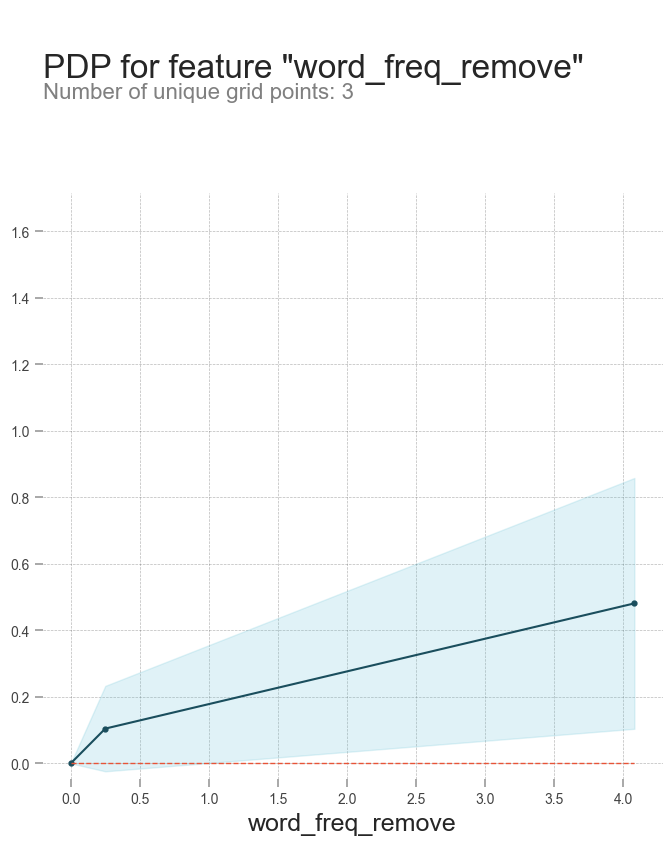

In [251]:
base_features = reduced_df.columns.values.tolist()
base_features.remove('spam')

feat_name = 'word_freq_remove'
pdp_dist = pdp.pdp_isolate(model=xgb_model,
                           dataset=X_test, 
                           model_features=base_features, 
                           feature=feat_name)
pdp.pdp_plot(pdp_dist, feat_name,plot_params = {
                                    'title_fontsize': 24,
                                    'subtitle_fontsize': 16},
                                     figsize = (8,10))
plt.xlabel('word_freq_remove', fontsize=18)
plt.show()

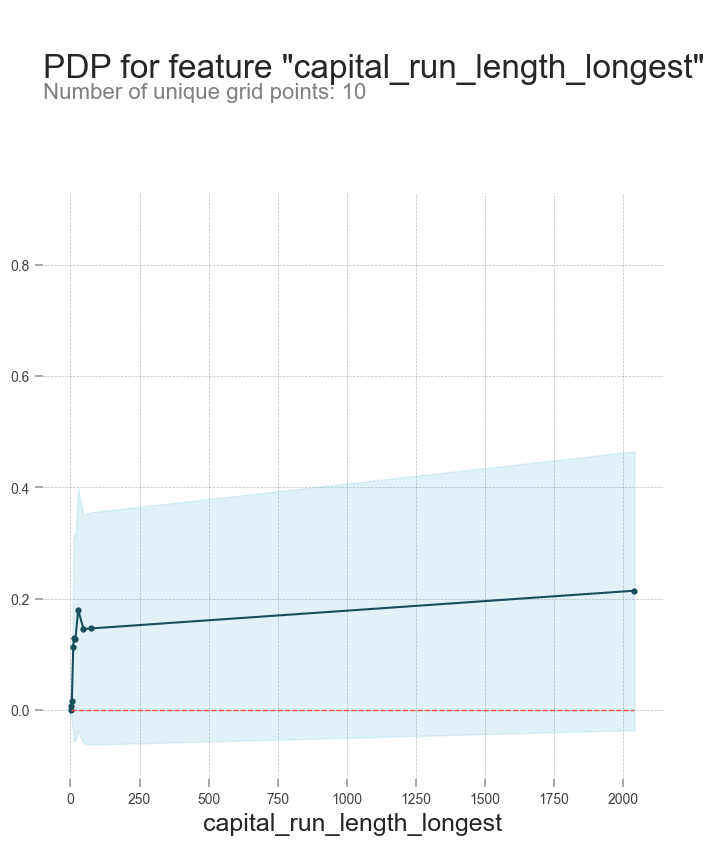

In [252]:
base_features = reduced_df.columns.values.tolist()
base_features.remove('spam')

feat_name = 'capital_run_length_longest'
pdp_dist = pdp.pdp_isolate(model=xgb_model,
                           dataset=X_test, 
                           model_features=base_features, 
                           feature=feat_name)
pdp.pdp_plot(pdp_dist, feat_name,plot_params = {
                                    'title_fontsize': 24,
                                    'subtitle_fontsize': 16},
                                     figsize = (8,10))
plt.xlabel('capital_run_length_longest', fontsize=18)
plt.show()

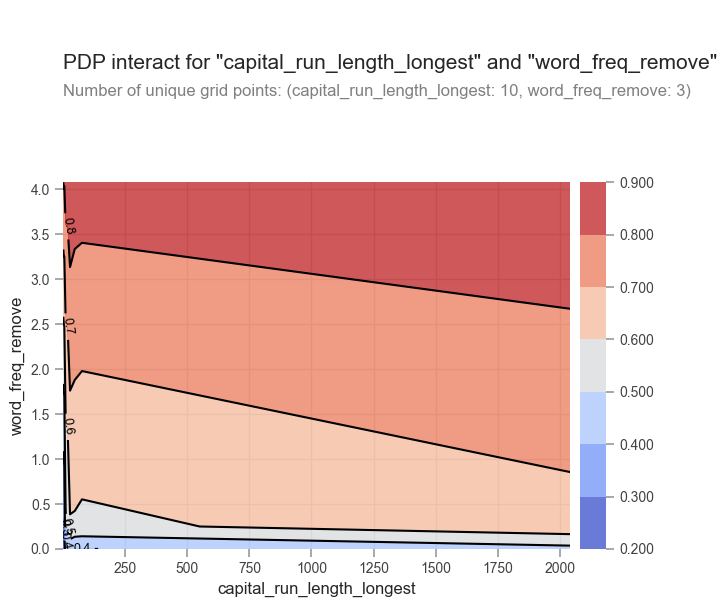

In [253]:
#Get interaction between st_depression and st_upslope
inter1  =  pdp.pdp_interact(model=xgb_model, dataset=X_test, model_features=base_features,
                            features=['capital_run_length_longest', 'word_freq_remove'])
pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=['capital_run_length_longest', 'word_freq_remove'],
                      plot_type='contour',figsize=(7,7),
                      plot_params = {'contour_color':  'black',
                                     'cmap': 'coolwarm',})
plt.show()

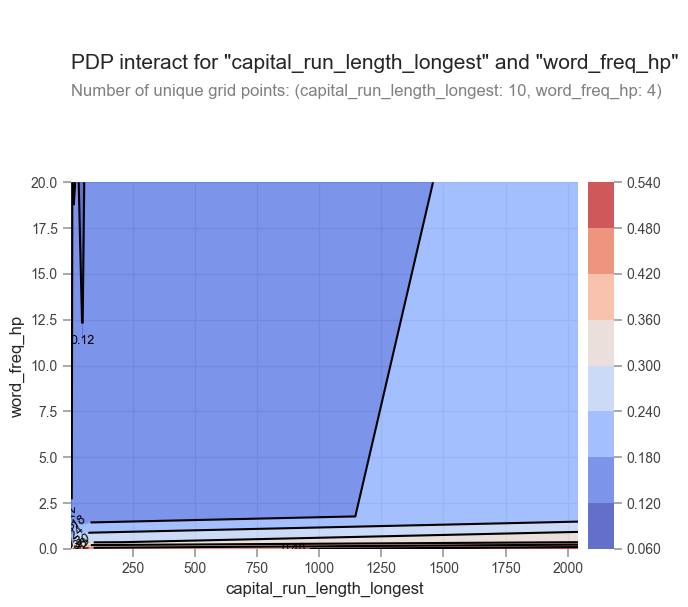

In [256]:
#Get interaction between st_depression and st_upslope
inter1  =  pdp.pdp_interact(model=xgb_model, dataset=X_test, model_features=base_features,
                            features=['capital_run_length_longest', 'word_freq_hp'])
pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=['capital_run_length_longest', 'word_freq_hp'],
                      plot_type='contour',figsize=(7,7),
                      plot_params = {'contour_color':  'black',
                                     'cmap': 'coolwarm',})
plt.show()

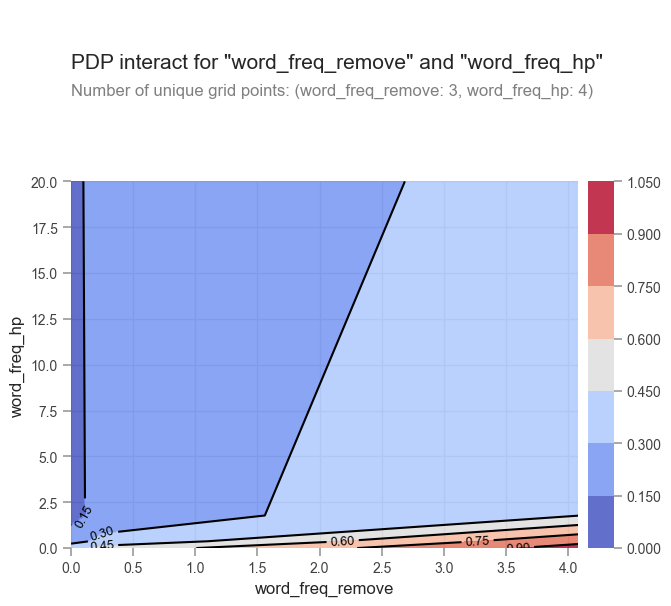

In [257]:
#Get interaction between st_depression and st_upslope
inter1  =  pdp.pdp_interact(model=xgb_model, dataset=X_test, model_features=base_features,
                            features=['word_freq_remove', 'word_freq_hp'])
pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=['word_freq_remove', 'word_freq_hp'],
                      plot_type='contour',figsize=(7,7),
                      plot_params = {'contour_color':  'black',
                                     'cmap': 'coolwarm',})
plt.show()

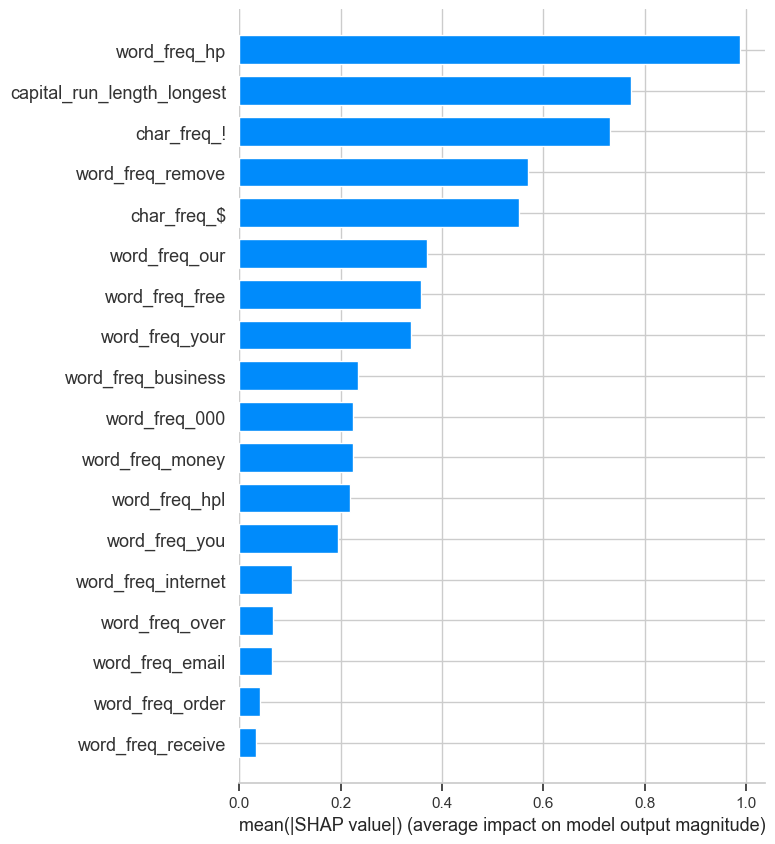

In [258]:
explainer = shap.Explainer(xgb_model)

shap_values = explainer.shap_values(X_test)

#Include the SHAP values for each feature in the plot
feature_names = [a + ": " + str(b) for a,b 
                 in zip(X_test.columns, np.abs(shap_values).mean(0).round(2))]

shap.summary_plot(shap_values, X_test, plot_type="bar")

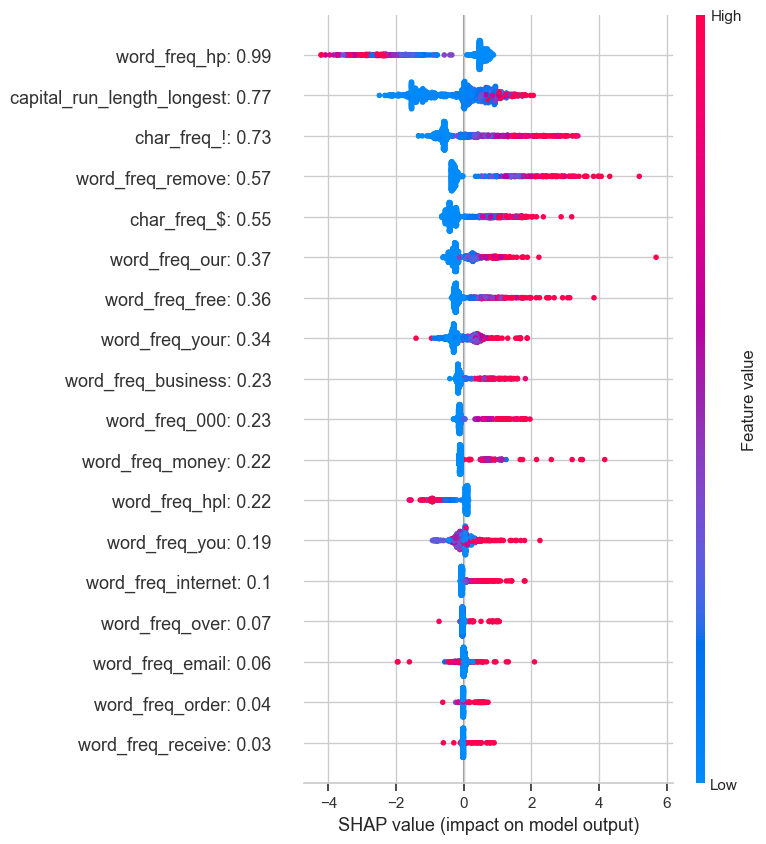

In [259]:
shap.summary_plot(shap_values, X_test,feature_names=feature_names)

In [260]:
def HD_risk_factors_SHAP(model, patient):

    explainer = shap.Explainer(model)
    shap_values = explainer.shap_values(patient)
    shap.initjs()
    return shap.force_plot(explainer.expected_value,
                           shap_values,
                           patient,
                           link = 'logit')

In [261]:
data_for_prediction = X_test.iloc[0,:].astype(float)
HD_risk_factors_SHAP(xgb_model, data_for_prediction)

In [264]:
y_predict = ['spam']

compound = y_predict[0]

#Designate independent and dependent variables
x  = reduced_df.drop([compound], axis = 1)
y  = reduced_df[compound]

le = preprocessing.LabelEncoder()
le.fit(y)
y = le.transform(y)

#Predict concentration over entire dataset
xgb_model.fit(x, y)
diagnosis_pred_full = xgb_model.predict(x)
# New Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y,diagnosis_pred_full)))
print('Precision Score : ' + str(precision_score(y,diagnosis_pred_full)))
print('Recall Score : ' + str(recall_score(y,diagnosis_pred_full)))
print('F1 Score : ' + str(f1_score(y,diagnosis_pred_full)))

Accuracy Score : 0.9691371440991089
Precision Score : 0.9728353140916808
Recall Score : 0.9481522338665196
F1 Score : 0.9603351955307262


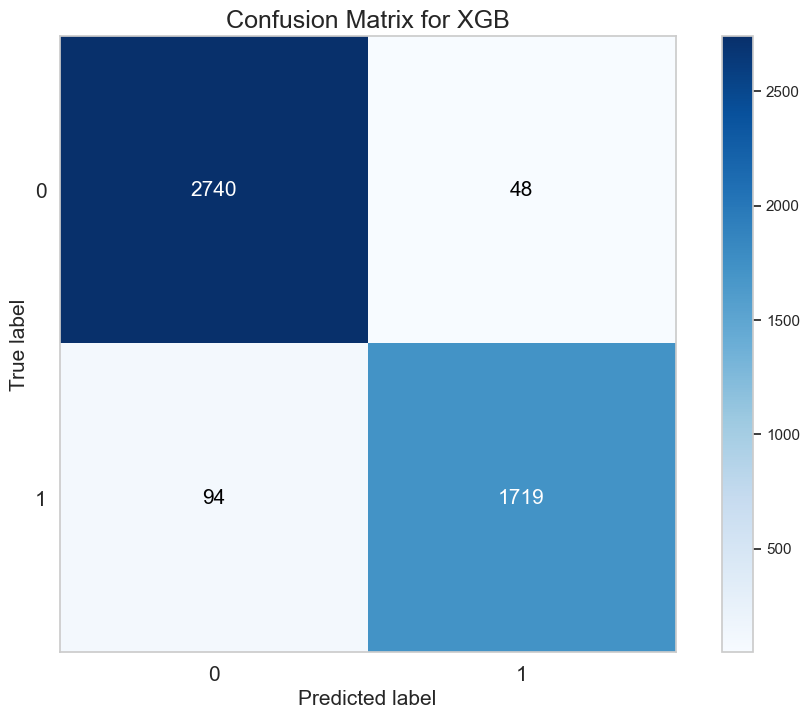

In [266]:
#confusion_matrix(y_test,y_pred_acc)
plt.rcParams.update({'font.size': 15})
skplt.metrics.plot_confusion_matrix(y, diagnosis_pred_full,
                                    normalize=False, title = 'Confusion Matrix for XGB')
plt.show()

In [265]:
shap.initjs()
shap_values = explainer.shap_values(x.iloc[:])
shap.force_plot(explainer.expected_value, shap_values, x.iloc[:],link='logit')